In [1]:
# Train, Test 파일 각각 갯수 세기
from glob import glob

print(f'훈련 데이터 개수 : {len(glob("./input/dataset/train/" + "*.jpg"))}')
print(f'테스트 데이터 개수 : {len(glob("./input/dataset/test/" + "*.jpg"))}')

훈련 데이터 개수 : 1204
테스트 데이터 개수 : 300


In [2]:
import pandas as pd

train = pd.read_csv('./input/dataset/train_output.csv')
test = pd.read_csv('./input/dataset/test_output.csv')
all = pd.concat([train, test]).reset_index(drop=True)

In [3]:
train.head()

,filename,label
0,1,1 0.438281 0.529551 0.814063 0.704492
1,2,3 0.541016 0.524324 0.849219 0.672973
2,3,2 0.492500 0.517045 0.695000 0.725000
3,4,2 0.585156 0.525000 0.692187 0.785135
4,5,3 0.385547 0.645270 0.614844 0.698649\n3 0.559...


In [4]:
test.head()

,filename,label
0,1205,1 0.662500 0.482394 0.606250 0.607981\n1 0.207...
1,1206,3 0.703906 0.629977 0.367188 0.707260\n3 0.331...
2,1207,2 0.511250 0.540338 0.832500 0.615385
3,1208,0 0.551562 0.545946 0.484375 0.494595
4,1209,3 0.429000 0.564000 0.702000 0.749333\n3 0.402...


In [5]:
def seperate_label(label):
    box_regions = []
    labels = []
    regions = label.split('\n')
    for region in regions:
        box_label = region.split()[0]
        box_region = " ".join(region.split()[1:])
        box_regions.append(box_region)
        labels.append(box_label)
    return '\n'.join(box_regions),'\n'.join(labels)

In [6]:
# 첫 번째 정수만 추출하여 새로운 컬럼 'extracted_label'에 저장
all['box_regions'], all['labels'] = zip(*all['label'].apply(seperate_label))
all['filename'] = all['filename'].astype(str).str.zfill(4)
all.drop(columns=['label'], inplace=True)
all.head()

,filename,box_regions,labels
0,0001,0.438281 0.529551 0.814063 0.704492,1
1,0002,0.541016 0.524324 0.849219 0.672973,3
2,0003,0.492500 0.517045 0.695000 0.725000,2
3,0004,0.585156 0.525000 0.692187 0.785135,2
4,0005,0.385547 0.645270 0.614844 0.698649\n0.559375 ...,3\n3\n3


In [17]:
# 새로운 데이터프레임 생성
new_rows = []

# 데이터프레임 이터레이션
for _, row in all.iterrows():
    filename = row["filename"]
    box_regions = row["box_regions"]
    labels = row["labels"]

    # box_regions와 labels를 \n으로 분할하여 여러 개의 행 생성
    box_regions = box_regions.split("\n")
    labels = labels.split("\n")

    # 분할된 box_regions와 labels를 개별적으로 처리하여 새로운 행 생성
    for box_region, label in zip(box_regions, labels):
        new_row = {"filename": filename, "box_regions": box_region, "labels": label}
        new_rows.append(new_row)

# 새로운 데이터프레임 생성
new_all = pd.DataFrame(new_rows)

new_all.rename(columns={'box_regions': 'box_region',
                        'labels' : 'label'}, inplace=True)
# box_region을 center_x, center_y, width, height로 나누기
new_all[['center_x', 'center_y', 'width', 'height']] = new_all['box_region'].str.split(' ', expand=True).astype(float)
new_all.drop(columns=["box_region"], inplace=True)

new_all[:10]

,filename,label,center_x,center_y,width,height
0,0001,1,0.438281,0.529551,0.814063,0.704492
1,0002,3,0.541016,0.524324,0.849219,0.672973
2,0003,2,0.492500,0.517045,0.695000,0.725000
3,0004,2,0.585156,0.525000,0.692187,0.785135
4,0005,3,0.385547,0.645270,0.614844,0.698649
5,0005,3,0.559375,0.682432,0.445313,0.629730
6,0005,3,0.143359,0.382432,0.286719,0.318919
7,0006,1,0.429688,0.596737,0.590625,0.778555
8,0007,3,0.516797,0.504054,0.380469,0.929730
9,0008,0,0.476526,0.520833,0.298122,0.404167


In [19]:
# filename을 정수형으로 변환
new_all["filename"] = new_all["filename"].astype(int)

# filename을 기준으로 train 데이터와 test 데이터 분할
train_df = new_all[new_all["filename"] <= 1204].reset_index().copy()
test_df = new_all[new_all["filename"] > 1204].reset_index().copy()

# filename을 다시 문자열로 변환
train_df["filename"] = train_df["filename"].astype(str).str.zfill(4)
test_df["filename"] = test_df["filename"].astype(str).str.zfill(4)

# train 데이터와 test 데이터를 각각 저장
train_df.to_csv("./input/dataset/new_train.csv", index=False)
test_df.to_csv("./input/dataset/new_test.csv", index=False)

전체 라벨값들 일일이 추출한 후에 비율을 구해보기

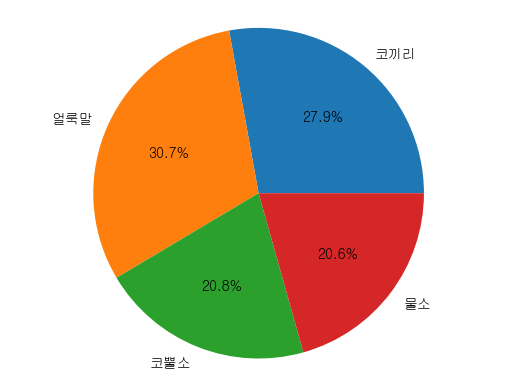

In [48]:
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc

# sns  한국어패치
font_path = "C:/Windows/Fonts/NGULIM.TTF"
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)


label_map = {
    0: '물소',
    1: '코끼리',
    2: '코뿔소',
    3: '얼룩말'
}

# 각 값들의 개수 계산
value_counts = {}
for value in new_all['label']:
    value = int(value)
    if label_map[value] in value_counts:
        value_counts[label_map[value]] += 1
    else:
        value_counts[label_map[value]] = 1


# 그래프 그리기
labels = list(value_counts.keys())
counts = list(value_counts.values())

plt.pie(counts, labels=labels, autopct='%1.1f%%')
plt.axis('equal')  # 원형으로 그리기
plt.show()

In [49]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec

def show_image_with_boxes(img_ids, box_regions, title, rows=2, cols=3, fig_height=15, fig_width=8):
    assert len(img_ids) <= rows * cols  # 이미지가 행/열 개수보다 많으면 오류 발생
    
    plt.figure(figsize=(fig_height, fig_width))  # 전체 Figure 크기 설정
    grid = gridspec.GridSpec(rows, cols)  # 서브플롯 배치
    plt.suptitle(title)
    # 이미지 출력 및 박스 영역 표시
    for idx, img_id in enumerate(img_ids):
        img_path = f'./input/dataset/train/{img_id}.jpg'
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax = plt.subplot(grid[idx])
        ax.imshow(image)  # 이미지 출력
        ax.set_title(f'Image ID: {img_id}')  # 이미지 제목 설정
        # 박스 영역 표시
        boxes = box_regions[idx].split('\n')  # 박스 영역들을 개별적으로 분리
        for box in boxes:
            box_info = box.split()  # 박스 영역 정보 분리
            if len(box_info) == 4:  # 박스 영역 정보가 유효한 경우에만 처리
                # 상대적인 수치를 실제 박스 영역으로 변환
                center_x = float(box_info[0])
                center_y = float(box_info[1])
                width = float(box_info[2])
                height = float(box_info[3])
                actual_width = width * image.shape[1]
                actual_height = height * image.shape[0]
                x = center_x * image.shape[1] - actual_width / 2
                y = center_y * image.shape[0] - actual_height / 2

                # 박스 영역을 빨간색 사각형으로 표시
                rect = patches.Rectangle((x, y), actual_width, actual_height, linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect)

    plt.tight_layout()
    plt.show()

In [60]:
train = all.iloc[:len(train)]
test = all.iloc[len(train):].reset_index(drop=True)

train.to_csv('./input/dataset/train.csv')
test.to_csv('./input/dataset/test.csv')

In [52]:
import numpy as np

def get_one_label_info(label):
    all_label_list = train['labels'].tolist()
    all_filename_list = train['filename'].tolist()
    all_box_regions_list = train['box_regions'].tolist()
    
    ret_filenames = []
    ret_box_regions = [] 
    for idx, tmp_label_list in enumerate(all_label_list):
        unique_list = list(set(tmp_label_list.split('\n')))
        if len(unique_list) > 1 or int(unique_list[0]) != label:
            continue
        else:
            ret_filenames.append(all_filename_list[idx])
            ret_box_regions.append(all_box_regions_list[idx])
    
    return ret_filenames, ret_box_regions

In [53]:
zero_filenames, zero_box_regions = get_one_label_info(0)
one_filenames, one_box_regions = get_one_label_info(1)
two_filenames, two_box_regions = get_one_label_info(2)
three_filenames, three_box_regions = get_one_label_info(3)

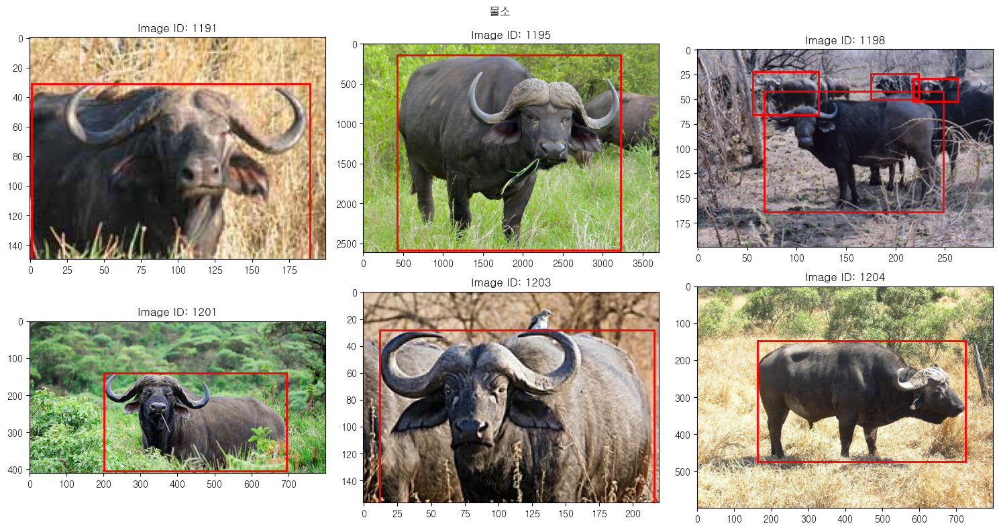

In [54]:
show_image_with_boxes(zero_filenames[-6:], zero_box_regions[-6:], "물소")

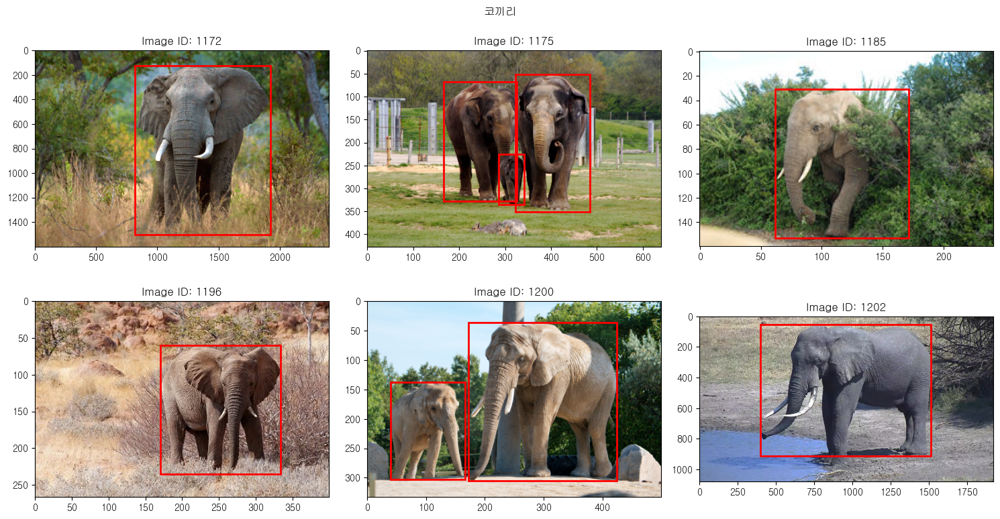

In [55]:
show_image_with_boxes(one_filenames[-6:], one_box_regions[-6:], "코끼리")

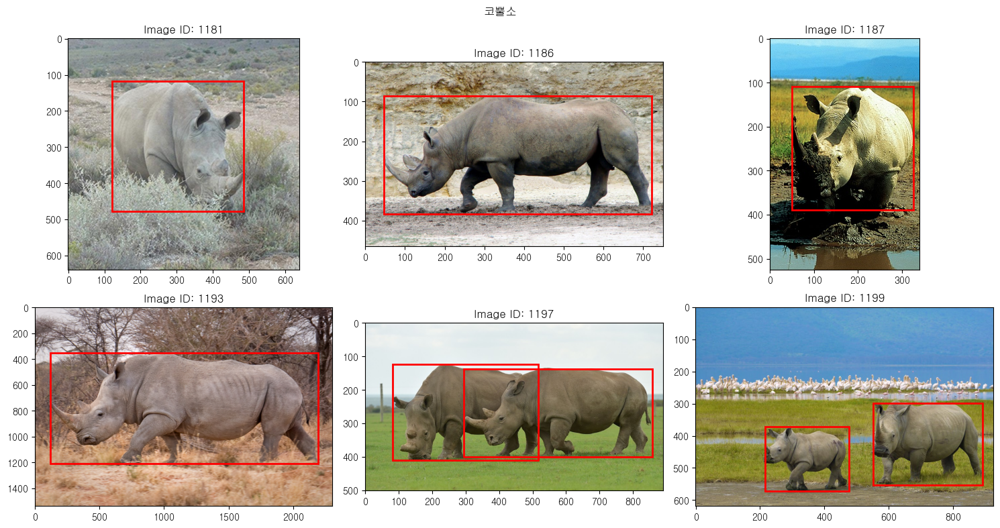

In [56]:
show_image_with_boxes(two_filenames[-6:], two_box_regions[-6:], "코뿔소")

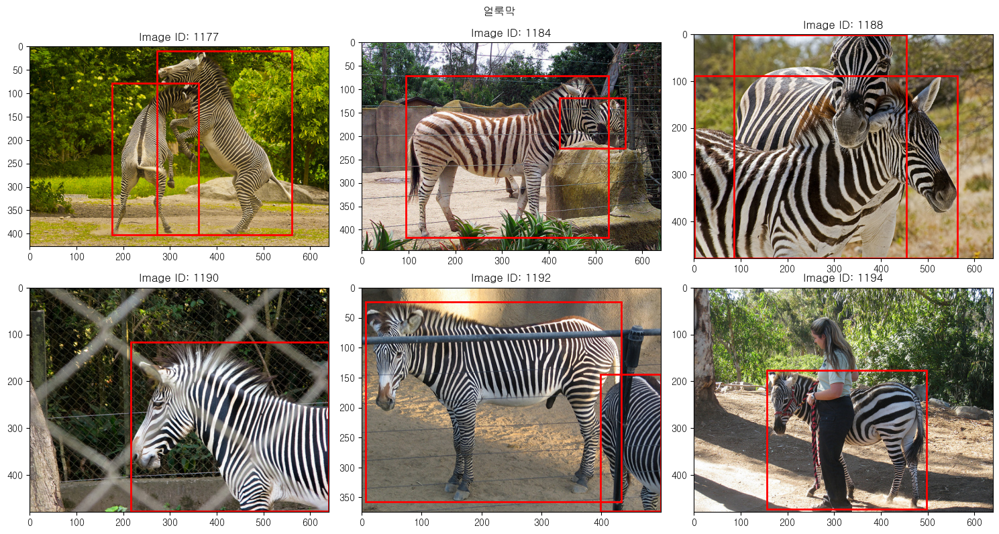

In [57]:
show_image_with_boxes(three_filenames[-6:], three_box_regions[-6:], "얼룩막")

한 이미지 내에 여러 라벨값이 있는 이미지 추출

In [58]:
special_image_ids = []  
tmp_label_list = train['labels'].tolist()
tmp_filename_list = train['filename'].tolist()

for idx,tmp in enumerate(tmp_label_list):
    tmp_list = list(set(tmp.split('\n')))
    if len(tmp_list) >=2:
        special_image_ids.append(tmp_filename_list[idx])
special_image_box_regions = train[train['filename'].isin(special_image_ids)]['box_regions'].tolist()

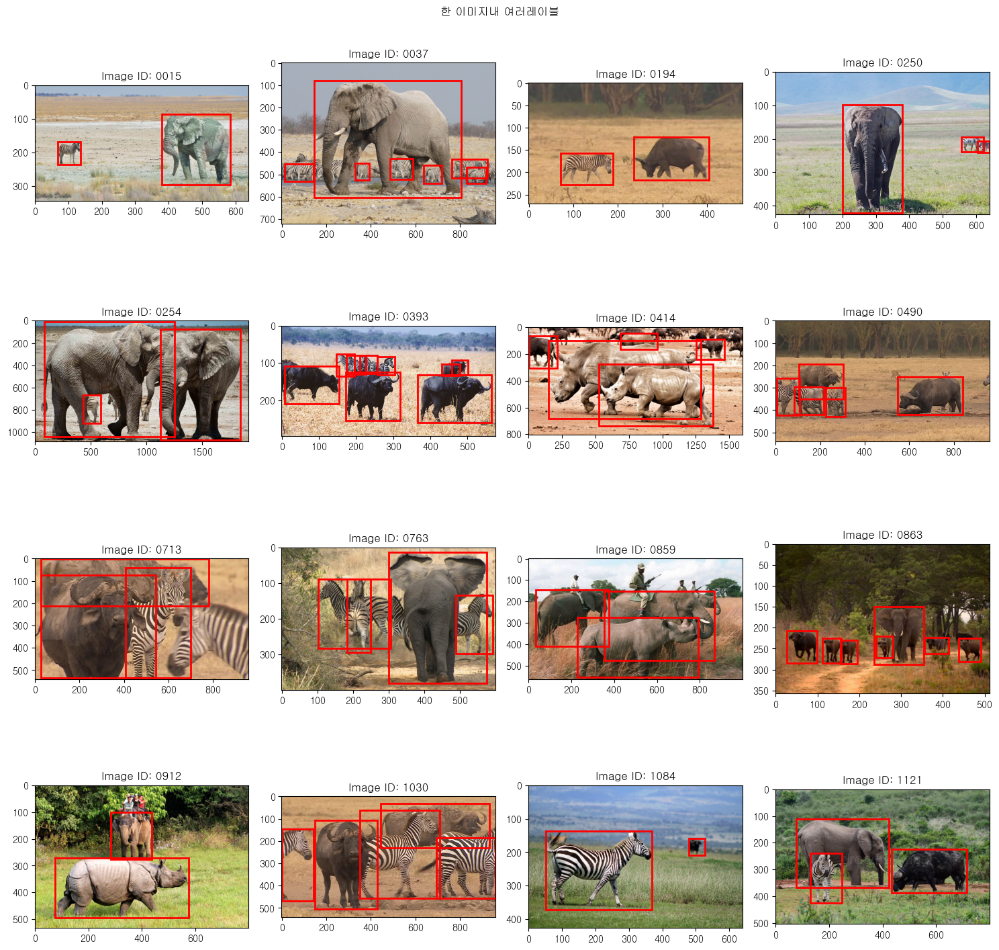

In [59]:
show_image_with_boxes(
    special_image_ids,special_image_box_regions,
    rows=4, cols=4, title="한 이미지내 여러레이블",
    fig_width=15, fig_height=15)